In [1]:
import scanpy as sc
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
from functions import * # my custom functions 
import scib
import pickle
import platform,socket,re,uuid,json,psutil,logging

# rpy2 for running R code|
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR) # Ignore R warning messages
import rpy2.robjects as ro
import anndata2ri

# scanpy config
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(frameon=False, dpi_save=1000)

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


scanpy==1.8.2 anndata==0.8.0 umap==0.5.1 numpy==1.19.5 scipy==1.5.4 pandas==1.1.5 scikit-learn==0.23.2 statsmodels==0.13.0 python-igraph==0.9.6 louvain==0.7.0 pynndescent==0.5.5


/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/umap/__init__.py:11: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  category=ImportWarning


In [2]:
def getSystemInfo():
    try:
        info={}
        info['platform']=platform.system()
        info['platform-release']=platform.release()
        info['platform-version']=platform.version()
        info['architecture']=platform.machine()
        info['processor']=platform.processor()
        info['ram']=str(round(psutil.virtual_memory().total / (1024.0 **3)))+" GB"
        return json.dumps(info)
    except Exception as e:
        logging.exception(e)

json.loads(getSystemInfo())

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'platform': 'Linux',
 'platform-release': '4.18.0-348.7.1.el8_5.x86_64',
 'platform-version': '#1 SMP Wed Dec 22 13:25:12 UTC 2021',
 'architecture': 'x86_64',
 'processor': 'x86_64',
 'ram': '504 GB'}

In [3]:
MY_PALETTES = dict(
    deep=["#4C72B0", "#DD8452", "#55A868", "#C44E52", "#8172B3",
          "#937860", "#DA8BC3", "#b5bd61", "#CCB974", "#64B5CD"],
    deep6=["#4C72B0", "#55A868", "#C44E52",
           "#8172B3", "#CCB974", "#64B5CD"],
    muted=["#4878D0", "#EE854A", "#6ACC64", "#D65F5F", "#956CB4",
           "#8C613C", "#DC7EC0", "#797979", "#D5BB67", "#82C6E2"],
    muted6=["#4878D0", "#6ACC64", "#D65F5F",
            "#956CB4", "#D5BB67", "#82C6E2"],
    pastel=["#A1C9F4", "#FFB482", "#8DE5A1", "#FF9F9B", "#D0BBFF",
            "#DEBB9B", "#FAB0E4", "#CFCFCF", "#FFFEA3", "#B9F2F0"],
    pastel6=["#A1C9F4", "#8DE5A1", "#FF9F9B",
             "#D0BBFF", "#FFFEA3", "#B9F2F0"],
    bright=["#023EFF", "#FF7C00", "#1AC938", "#E8000B", "#8B2BE2",
            "#9F4800", "#F14CC1", "#A3A3A3", "#FFC400", "#00D7FF"],
    bright6=["#023EFF", "#1AC938", "#E8000B",
             "#8B2BE2", "#FFC400", "#00D7FF"],
    dark=["#001C7F", "#B1400D", "#12711C", "#8C0800", "#591E71",
          "#592F0D", "#A23582", "#3C3C3C", "#B8850A", "#006374"],
    dark6=["#001C7F", "#12711C", "#8C0800",
           "#591E71", "#B8850A", "#006374"],
    colorblind=["#0173B2", "#DE8F05", "#029E73", "#D55E00", "#CC78BC",
                "#CA9161", "#FBAFE4", "#949494", "#ECE133", "#56B4E9"],
    colorblind6=["#0173B2", "#029E73", "#D55E00",
                 "#CC78BC", "#ECE133", "#56B4E9"]
)

# Data loading and manual filtering

Here we load the raw datasets and store appropiate metadata in anndata

## Hinze sCell

In [ ]:
Hinze_sCell = {}
Hinze_sCell['scCortex'] = sc.read_text("/exports/humgen/cnovellarausell/KidneyAtlas/data/Hinze20/scell/scCortex_DGE.txt").transpose()
Hinze_sCell['scIM'] = sc.read_text("/exports/humgen/cnovellarausell/KidneyAtlas/data/Hinze20/scell/scIM_DGE.txt").transpose()
Hinze_sCell['scOM'] = sc.read_text("/exports/humgen/cnovellarausell/KidneyAtlas/data/Hinze20/scell/scOM_DGE.txt").transpose()
Hinze_sCell['scWk1'] = sc.read_text("/exports/humgen/cnovellarausell/KidneyAtlas/data/Hinze20/scell/scwk1_DGE.txt").transpose()
Hinze_sCell['scWk2'] = sc.read_text("/exports/humgen/cnovellarausell/KidneyAtlas/data/Hinze20/scell/scwk2_DGE.txt").transpose()
Hinze_sCell = Hinze_sCell['scCortex'].concatenate(Hinze_sCell['scIM'], Hinze_sCell['scOM'], Hinze_sCell['scWk1'], Hinze_sCell['scWk2'])

In [ ]:
authors_barcodes = Hinze_sCell.obs.index.tolist()
authors_barcodes = [i.split('-')[0] for i in authors_barcodes]
del Hinze_sCell

In [ ]:
Hinze_sCell_kb = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Hinze_sCell/output/counts_unfiltered/adata.h5ad")
kb_list = Hinze_sCell_kb.obs.index.tolist()
to_keep = list(set(authors_barcodes) & set(kb_list))

In [ ]:
Hinze_sCell = Hinze_sCell_kb[to_keep]
Hinze_sCell.var_names_make_unique()
del Hinze_sCell_kb

In [ ]:
tissue_res = pd.read_csv("/exports/humgen/cnovellarausell/KidneyAtlas/annotations/Hinze_sCell_tissue_res.tsv", delimiter='\t', header=None, index_col=0)
tissue_res = tissue_res[~tissue_res.index.duplicated(keep='first')]

In [ ]:
Hinze_sCell.obs['Tissue_res'] = tissue_res

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t")
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]
Hinze_sCell.var["gene_id"] = Hinze_sCell.var.index.values
Hinze_sCell.var["gene_name"] = Hinze_sCell.var.gene_id.map(t2g["gene_name"])
Hinze_sCell.var.index = Hinze_sCell.var["gene_name"]

In [ ]:
sc.pp.filter_cells(Hinze_sCell, min_genes=200) 
sc.pp.filter_cells(Hinze_sCell, max_genes= 3500) 

In [ ]:
Hinze_sCell.obs['Source'] = 'Cell'
Hinze_sCell.obs['Origin'] = 'Hinze20_sCell'
Hinze_sCell.obs['Technology'] = 'Drop-seq'
Hinze_sCell.obs['Age'] = '3-6months'
Hinze_sCell.obs['Genetic_background'] = 'C57BL/6'
Hinze_sCell.obs['Gender'] = 'Male'

In [ ]:
Hinze_sCell.obs_names_make_unique()
Hinze_sCell.var_names_make_unique()

## Hinze sNuc

In [ ]:
Hinze_sNuc_v2_kb = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Hinze_sNuc_v2chem/output/counts_filtered/adata.h5ad")
Hinze_sNuc_v3_kb = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Hinze_sNuc_v3chem/output/counts_filtered/adata.h5ad")

In [ ]:
Hinze_sNuc = Hinze_sNuc_v2_kb.concatenate(Hinze_sNuc_v3_kb)

In [ ]:
new_index = Hinze_sNuc.obs.index.to_series().str.split("-").str[0]
Hinze_sNuc.obs.rename(index=new_index, inplace=True)

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t", usecols=[0,1,2])
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]
Hinze_sNuc.var["gene_id"] = Hinze_sNuc.var.index.values
Hinze_sNuc.var["gene_name"] = Hinze_sNuc.var.gene_id.map(t2g["gene_name"])
Hinze_sNuc.var.index = Hinze_sNuc.var["gene_name"]

In [ ]:
Hinze_sNuc.var_names_make_unique()

In [ ]:
sc.pp.filter_cells(Hinze_sNuc, min_genes=500)
sc.pp.filter_cells(Hinze_sNuc, max_genes= 5000)

In [ ]:
Hinze_sNuc.obs['Tissue_res'] = 'Whole_Kidney'
Hinze_sNuc.obs['Origin'] = 'Hinze20_sNuc'
Hinze_sNuc.obs['Source'] = 'Nuclei'
Hinze_sNuc.obs['Technology'] = '10X'
Hinze_sNuc.obs['Age'] = '3-6months'
Hinze_sNuc.obs['Genetic_background'] = 'C57BL/6'
Hinze_sNuc.obs['Gender'] = 'Male'

In [ ]:
Hinze_sNuc.obs_names_make_unique()
Hinze_sNuc.var_names_make_unique()

## Kirita 20

In [ ]:
Kirita20_authors = sc.read_text('/exports/humgen/cnovellarausell/KidneyAtlas/data/Kirita20/Sham.mtx').transpose()

In [ ]:
authors_barcodes = Kirita20_authors.obs.index.tolist()
authors_barcodes = [i.split('_')[1] for i in authors_barcodes]
del Kirita20_authors

In [ ]:
Kirita20_kb = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Kirita20/output/counts_unfiltered/adata.h5ad")
kb_list = Kirita20_kb.obs.index.tolist()
to_keep = list(set(authors_barcodes) & set(kb_list))

In [ ]:
Kirita20 = Kirita20_kb[to_keep]
del Kirita20_kb

In [ ]:
annotations = pd.read_csv("/exports/humgen/cnovellarausell/KidneyAtlas/annotations/Kirita20_annotations.tsv", delimiter='\t', header=None, index_col=0)
annotations = annotations[~annotations.index.duplicated(keep='first')]

In [ ]:
Kirita20.obs['Celltype_Kirita'] = annotations
Rename_Kirita = {
'EC1': 'Endo',
'EC2': 'Endo',
'CTAL1': 'CTAL',
'CTAL2': 'CTAL',
'PC1': 'PC', 
'PC2': 'PC',
'Pod': 'Podo',
'Mø': 'Macro',
'Tcell': 'T lymph'
}
Kirita20.obs['Celltype_Kirita'] = Kirita20.obs['Celltype_Kirita'].replace(Rename_Kirita)

In [ ]:
#Remove cells annotated as NewPT1 and NewPT2, these are from AKI conditions
Kirita20 = Kirita20[~Kirita20.obs['Celltype_Kirita'].isin(['NewPT1', 'NewPT2', 'Uro']),:]

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t", usecols = [0,1,2])
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

In [ ]:
Kirita20.var["gene_id"] = Kirita20.var.index.values
Kirita20.var["gene_name"] = Kirita20.var.gene_id.map(t2g["gene_name"])
Kirita20.var.index = Kirita20.var["gene_name"]

In [ ]:
Kirita20.obs['Origin'] = "Kirita20"
Kirita20.obs['Source'] = 'Nuclei'
Kirita20.obs['Technology'] = '10X'
Kirita20.obs['Tissue_res'] = "Whole_Kidney"
Kirita20.obs['Age'] = '8-10weeks'
Kirita20.obs['Genetic_background'] = "C57BL/6"
Kirita20.obs['Gender'] = 'Male'

In [ ]:
sc.pp.filter_cells(Kirita20, min_genes=200) 
sc.pp.filter_cells(Kirita20, max_genes= 3500) 

In [ ]:
Kirita20.obs_names_make_unique()
Kirita20.var_names_make_unique()

## Park18 sCell

In [ ]:
Park18 = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Park18/output/counts_unfiltered/adata.h5ad")

In [ ]:
annotations = pd.read_csv("/exports/humgen/cnovellarausell/KidneyAtlas/annotations/Park18_annotations.tsv", delimiter='\t', header=None, index_col=0)
annotations = annotations[~annotations.index.duplicated(keep='first')]

In [ ]:
Park18.obs['Celltype_Park'] = annotations


In [ ]:
Park18.obs['Celltype_Park'] = annotations
Rename_Park = {
'Novel 2' : 'Unknown',
'Novel': 'Unknown',
'CD-IC': 'IC',
'CD-PC': 'PC',
}
Park18.obs['Celltype_Park'] = Park18.obs['Celltype_Park'].replace(Rename_Park)

In [ ]:
Park18.obs['Origin'] = "Park18"
Park18.obs['Source'] = 'Cell'
Park18.obs['Technology'] = '10X'
Park18.obs['Age'] = '4-8weeks'
Park18.obs['Genetic_background'] = 'C57BL/6'
Park18.obs['Tissue_res'] = "Whole_Kidney"
Park18.obs['Gender'] = "Male"

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t")
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

In [ ]:
Park18.var["gene_id"] = Park18.var.index.values
Park18.var["gene_name"] = Park18.var.gene_id.map(t2g["gene_name"])
Park18.var.index = Park18.var["gene_name"]

In [ ]:
Park18.var_names_make_unique()

In [ ]:
sc.pp.filter_cells(Park18, min_genes=200) 
sc.pp.filter_cells(Park18, max_genes= 3000) 

In [ ]:
Park18.var['mt'] = Park18.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(Park18, qc_vars=['mt'], percent_top=None, inplace=True)
Park18 = Park18[Park18.obs.pct_counts_mt < 50, :]

In [ ]:
Park18.obs_names_make_unique()
Park18.var_names_make_unique()

## Wu19

In [ ]:
Wu19_authors = sc.read_text("/exports/humgen/cnovellarausell/KidneyAtlas/data/Wu19/GSE119531_Healthy.combined.dge.txt").transpose()

In [ ]:
authors_barcodes = Wu19_authors.obs.index.tolist()
technologies = [i.split('_')[0] for i in authors_barcodes]
authors_barcodes = [i.split('_')[1] for i in authors_barcodes]
d = {'barcode': authors_barcodes, 'tech': technologies}
df = pd.DataFrame(d)
df.set_index('barcode', inplace=True)
df = df[~df.index.duplicated(keep='first')]
del Wu19_authors

In [ ]:
Wu19_kb_Dropseq = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Wu19/DROPSEQ/counts_unfiltered/adata.h5ad")
authors_barcodes = df.loc[df['tech'] == 'sCellDropseq'].index.tolist()
kb_barcodes = Wu19_kb_Dropseq.obs.index.tolist()
to_keep = list(set(authors_barcodes) & set(kb_barcodes))
Wu19_kb_Dropseq = Wu19_kb_Dropseq[to_keep]
Wu19_kb_Dropseq.obs['Technology'] = 'Drop-seq'
Wu19_kb_Dropseq.obs['Source'] = 'Cell'

In [ ]:
Wu19_kb_10XNUCV2 = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Wu19/10XNUCV2/counts_unfiltered/adata.h5ad")
authors_barcodes = df.loc[df['tech'] == 'sNuc.10x'].index.tolist()
kb_barcodes = Wu19_kb_10XNUCV2.obs.index.tolist()
to_keep = list(set(authors_barcodes) & set(kb_barcodes))
Wu19_kb_10XNUCV2 = Wu19_kb_10XNUCV2[to_keep]
Wu19_kb_10XNUCV2.obs['Technology'] = '10X'
Wu19_kb_10XNUCV2.obs['Source'] = 'Nuclei'

In [ ]:
Wu19_kb_DroNcSeq = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Wu19/DroNcSeq/counts_unfiltered/adata.h5ad")
authors_barcodes = df.loc[df['tech'] == 'DroNcSeq'].index.tolist()
kb_barcodes = Wu19_kb_DroNcSeq.obs.index.tolist()
to_keep = list(set(authors_barcodes) & set(kb_barcodes))
Wu19_kb_DroNcSeq = Wu19_kb_DroNcSeq[to_keep]
Wu19_kb_DroNcSeq.obs['Technology'] = 'DroNcSeq'
Wu19_kb_DroNcSeq.obs['Source'] = 'Nuclei'

In [ ]:
Wu19_kb_NucDROPSEQ = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Wu19/NucDROPSEQ/counts_unfiltered/adata.h5ad")
authors_barcodes = df.loc[df['tech'] == 'sNucDropseq'].index.tolist()
kb_barcodes = Wu19_kb_NucDROPSEQ.obs.index.tolist()
to_keep = list(set(authors_barcodes) & set(kb_barcodes))
Wu19_kb_NucDROPSEQ = Wu19_kb_NucDROPSEQ[to_keep]
Wu19_kb_NucDROPSEQ.obs['Technology'] = 'Drop-seq'
Wu19_kb_NucDROPSEQ.obs['Source'] = 'Nuclei'

In [ ]:
Wu19 = Wu19_kb_Dropseq.concatenate(Wu19_kb_DroNcSeq, Wu19_kb_NucDROPSEQ, Wu19_kb_10XNUCV2)
del Wu19_kb_Dropseq, Wu19_kb_DroNcSeq, Wu19_kb_NucDROPSEQ, Wu19_kb_10XNUCV2

In [ ]:
new_index = Wu19.obs.index.to_series().str.split("-").str[0]
Wu19.obs.rename(index=new_index, inplace=True)

In [ ]:
annotations = pd.read_csv("/exports/humgen/cnovellarausell/KidneyAtlas/annotations/wu19_annotations.tsv", delimiter='\t', header=None, index_col=0)
annotations = annotations[~annotations.index.duplicated(keep='first')]

In [ ]:
Wu19.obs['Celltype_Wu'] = annotations

In [ ]:
Rename_Wu = {
    'EC': 'Endo',
    'Pod': 'Podo',
    'MØ': 'Macro',
    'IC-A': 'ICA',
    'IC-B': 'ICB',
    'PT(S3)': 'PTS3',
    'LH(DL)': 'DTL',
    'LH(AL)': 'ATL',
    'PT(S1-S2)': 'PTS1-2',
    'CD-PC': 'PC'
}

Wu19.obs = Wu19.obs.replace({'Celltype_Wu': Rename_Wu}) 

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t", usecols = [0,1,2])
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

In [ ]:
Wu19.var["gene_id"] = Wu19.var.index.values
Wu19.var["gene_name"] = Wu19.var.gene_id.map(t2g["gene_name"])
Wu19.var.index = Wu19.var["gene_name"]

In [ ]:
sc.pp.filter_cells(Wu19, max_genes= 3500) 
sc.pp.filter_cells(Wu19, min_genes=200)
Wu19.var['mt'] = Wu19.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(Wu19, qc_vars=['mt'], percent_top=None, inplace=True)
Wu19 = Wu19[Wu19.obs.pct_counts_mt < 50, :]

In [ ]:
Wu19.obs['Origin'] = 'Wu19'
Wu19.obs['Age'] = 'Adult'
Wu19.obs['Genetic_background'] = 'C57BL/6'
Wu19.obs['Gender'] = 'Male'
Wu19.obs['Tissue_res'] = "Whole_Kidney"

In [ ]:
Wu19.obs_names_make_unique()
Wu19.var_names_make_unique()

## Dumas sCell

In [ ]:
Dumas_cortex = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Dumas_cortex/output/counts_filtered/adata.h5ad")
Dumas_cortex.obs['Tissue_res'] = 'Cortex'
Dumas_glom = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Dumas_glom/output/counts_filtered/adata.h5ad")
Dumas_glom.obs['Tissue_res'] = 'Glom'
Dumas_medulla = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Dumas_medulla/output/counts_filtered/adata.h5ad")
Dumas_medulla.obs['Tissue_res'] = 'Medulla'

In [ ]:
Dumas = Dumas_cortex.concatenate(Dumas_glom, Dumas_medulla)

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t")
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

Dumas.var["gene_id"] = Dumas.var.index.values
Dumas.var["gene_name"] = Dumas.var.gene_id.map(t2g["gene_name"])
Dumas.var.index = Dumas.var["gene_name"]

Dumas.var_names_make_unique()

In [ ]:
sc.pp.filter_cells(Dumas, min_genes=200)
sc.pp.filter_cells(Dumas, max_genes= 3500)

In [ ]:
Dumas.var['mt'] = Dumas.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(Dumas, qc_vars=['mt'], percent_top=None,  inplace=True)

In [ ]:
Dumas = Dumas[Dumas.obs.pct_counts_mt < 10, :]

In [ ]:
Dumas.obs['Origin'] = 'Dumas20'
Dumas.obs['Source'] = 'Cell'
Dumas.obs['Technology'] = '10X'
Dumas.obs['Age'] = '12-week'
Dumas.obs['Genetic_background'] = 'C57BL/6'
Dumas.obs['Gender'] = 'Male'

In [ ]:
Dumas.obs_names_make_unique()
Dumas.var_names_make_unique()

In [13]:
reduce_adata(Dumas20)

-----
Here we aimed at replicating the original author's annotations using their markers and unsupervised clustering

In [12]:
Endo_general = ["Nrp1", "Cdh5", "Eln"]
Glom_endo = ["Plat", "Emcn",  "Mapt", "Kdr", "Smad6", "Ehd3", "Lpl", "Flt1", "Fbln2", "Mgp", "Trpv4", "Bmx"]
Capillaries = ['Kdr', 'Smad6', 'Ehd3', 'Lpl', 'Flt1']
Art = ['Fbln2', 'Mgp', 'Trpv4', 'Bmx', 'Sox17', 'Cxcl12', 'Gja5']
Vas_afferens = ['Edn1', 'Fbln5', 'Cldn5', 'Efnb2', 'Alox12']
Vas_efferens = ['Klf4', 'Cryab', 'Gas6', 'Podxl', 'Rdx', 'Calca', 'Thbd']
Peritubular_capillaries = ['Plvap']
Veins_venules = ['Plvap', 'Bgn', 'Cd9']
Ascending_vasa_recta = ['Fxyd2', 'Fxyd6', 'Igfbp7']
Descending_vasa_recta = ['Slc14a1', 'Aqp1', 'S100a4']

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


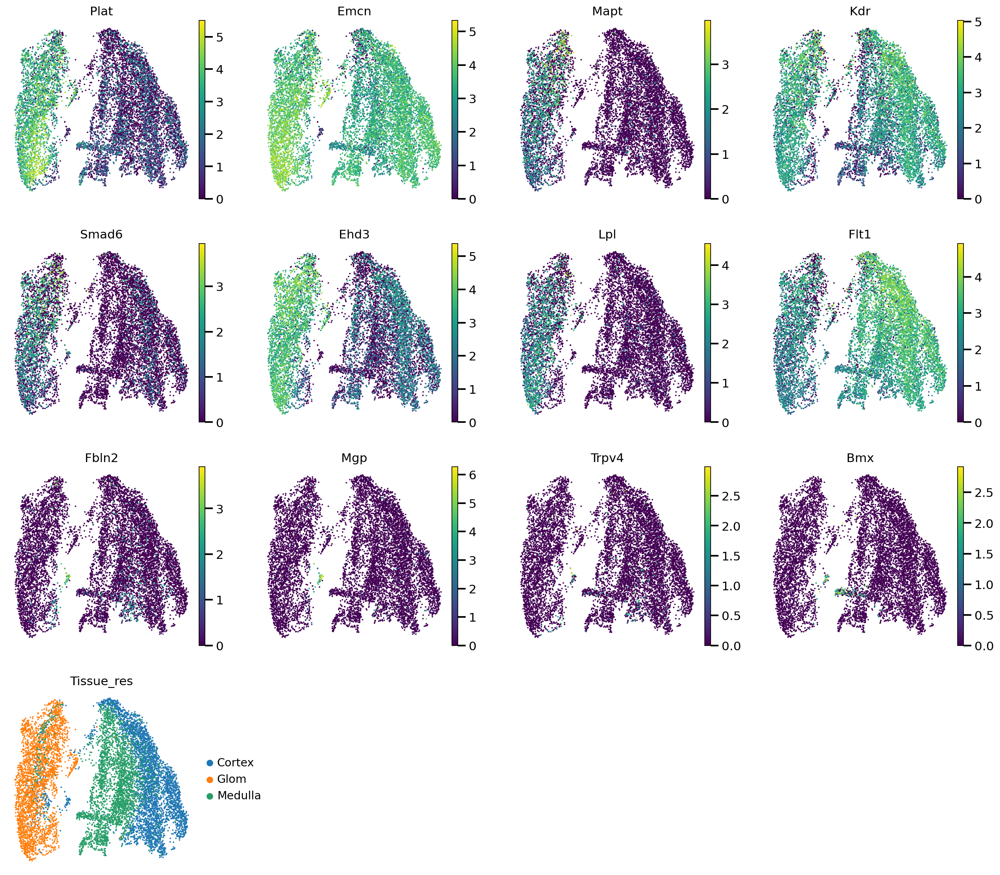

In [15]:
sc.pl.umap(Dumas20, color=Glom_endo + ['Tissue_res'], save='Glom-Endo-Dumas.svg')

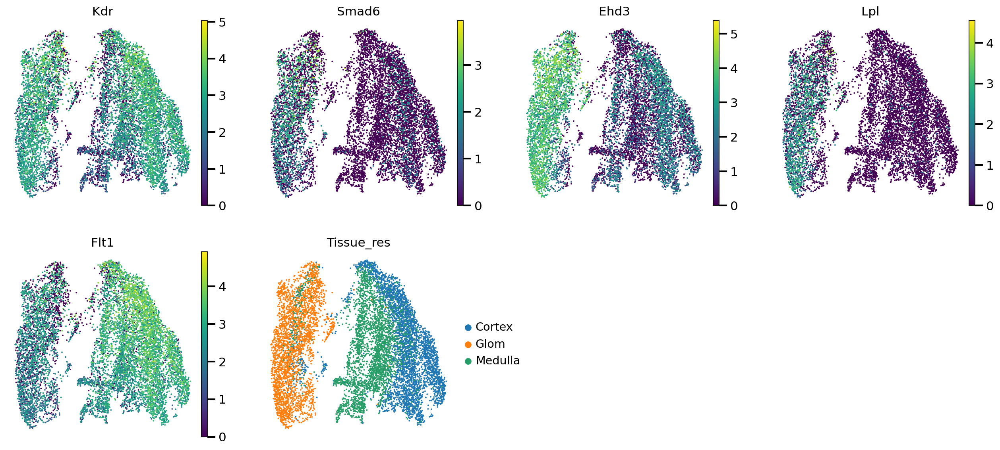

In [16]:
sc.pl.umap(Dumas20, color=Capillaries + ['Tissue_res'], save = 'Capillaries-Endo-Dumas.svg')

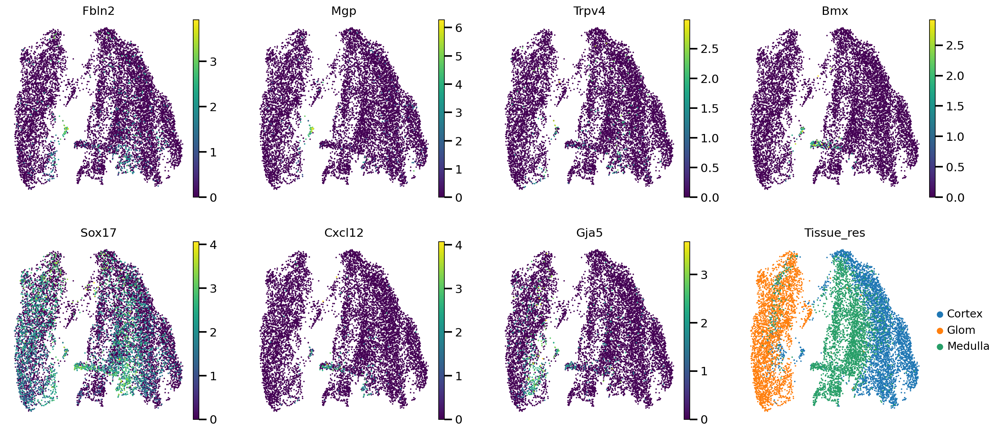

In [17]:
sc.pl.umap(Dumas20, color=Art + ['Tissue_res'], save = 'Art-Endo-Dumas.svg')

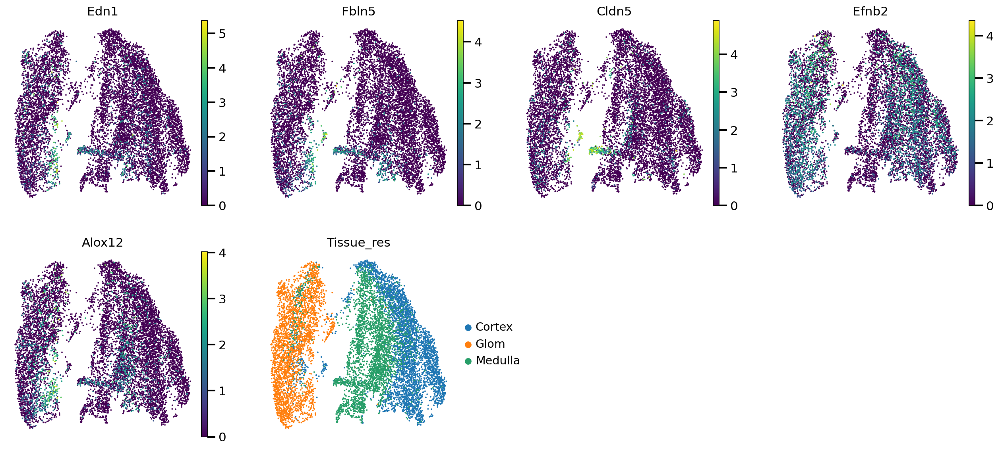

In [18]:
sc.pl.umap(Dumas20, color=Vas_afferens + ['Tissue_res'], save = 'Vas_afferens-Endo-Dumas.svg')

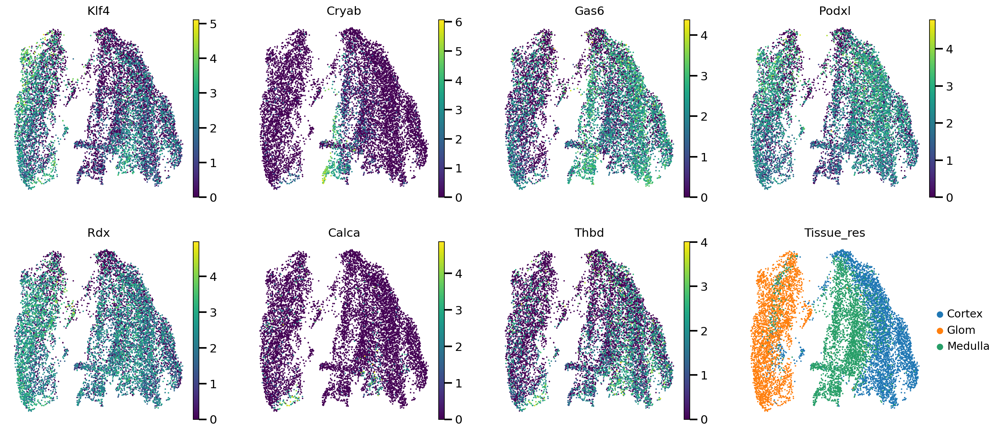

In [19]:
sc.pl.umap(Dumas20, color=Vas_efferens + ['Tissue_res'], save = 'Vas_efferens-Endo-Dumas.svg')

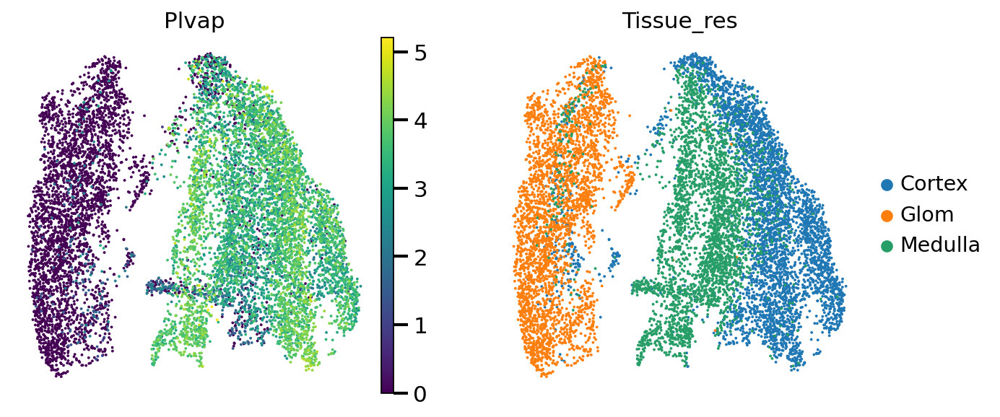

In [20]:
sc.pl.umap(Dumas20, color=Peritubular_capillaries + ['Tissue_res'], save = 'Peritubular_capillaries-Endo-Dumas.svg')

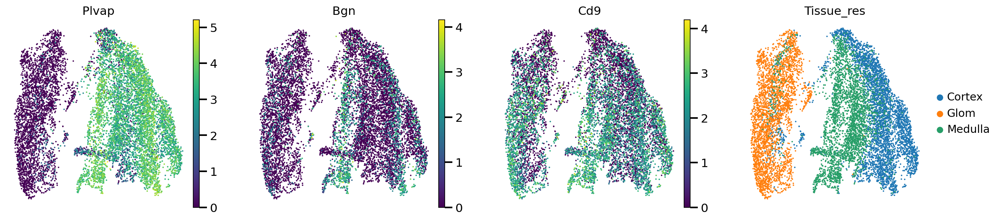

In [21]:
sc.pl.umap(Dumas20, color=Veins_venules + ['Tissue_res'], save = 'Veins_venules-Endo-Dumas.svg')

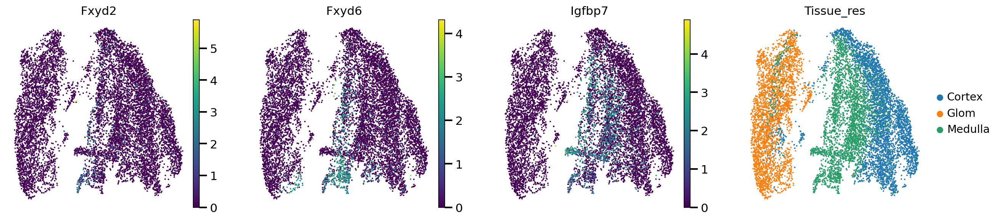

In [16]:
sc.pl.umap(Dumas20, color=Ascending_vasa_recta + ['Tissue_res'], save = 'Ascending_vasa_recta-Endo-Dumas.svg')

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


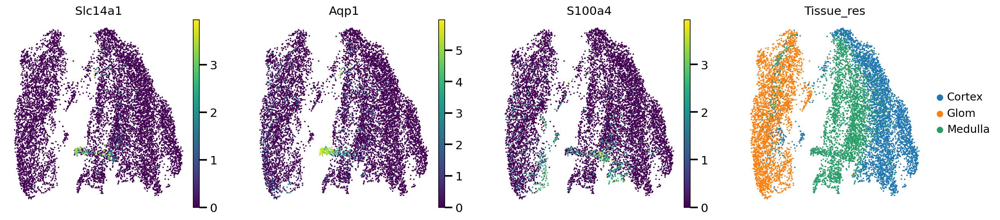

In [24]:
sc.pl.umap(Dumas20, color=Descending_vasa_recta + ['Tissue_res'], save = 'Descending_vasa_recta-Endo-Dumas.svg')

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


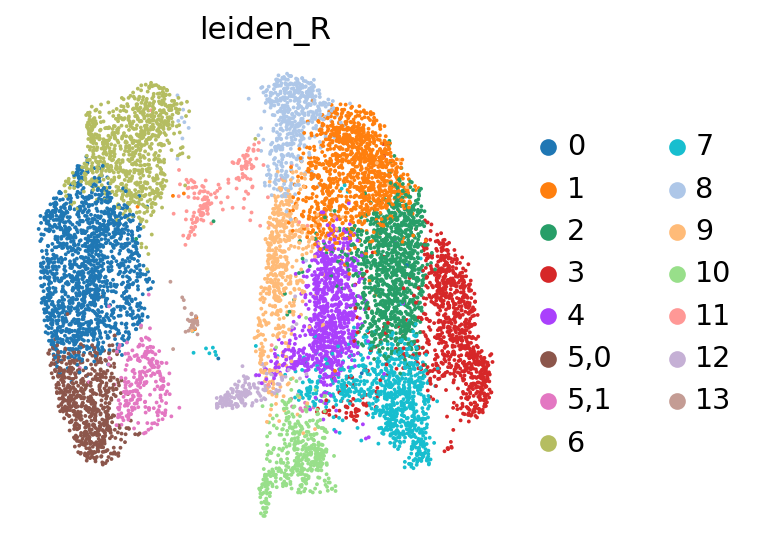

In [50]:
sc.pp.neighbors(Dumas20, n_neighbors=10)
sc.tl.leiden(Dumas20, resolution=0.7)
sc.tl.leiden(Dumas20, restrict_to=('leiden', ['5']), resolution=0.15)
sc.pl.umap(Dumas20, color='leiden_R', save='Endo-Dumas-Leiden.svg')

In [51]:
leiden_rename = {
    '0': 'Glom-Endo',
    '1': 'Endo',
    '2': 'Endo',
    '3': 'Endo',
    '4': 'Endo',
    '5,0': 'Glom-Endo',
    '5,1': 'Vas-Efferens',
    '6': 'Glom-Endo',
    '7': 'Endo',
    '8': 'Endo',
    '9': 'Endo',
    '10': 'Asc-Vasa-Recta',
    '11': 'Endo',
    '12': 'Desc-Vasa-Recta',
    '13': 'Vas-Afferens'}

Dumas20.obs['newLeiden'] = Dumas20.obs['leiden_R'].replace(leiden_rename).astype('category')

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


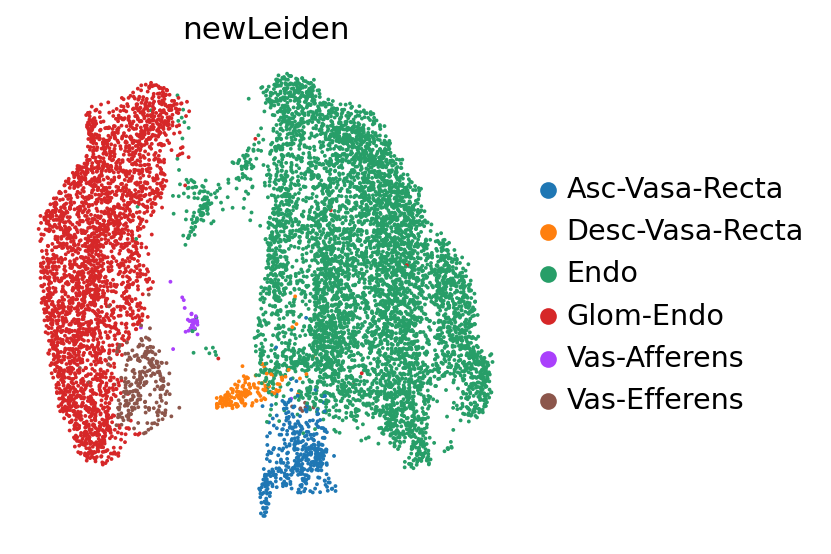

In [52]:
sc.pl.umap(Dumas20, color='newLeiden', save='Endo-Dumas-Leiden-resolved.svg')

--------

## Conway20 

In [ ]:
Conway20 = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Conway20/output/counts_filtered/adata.h5ad")
Conway20.obs['Origin'] = "Conway20"
Conway20.obs['Source'] = 'Cell'
Conway20.obs['Technology'] = '10X'
Conway20.obs['Tissue_res'] = "Whole_Kidney"
Conway20.obs['Age'] = '8weeks'
Conway20.obs['Genetic_background'] = "C57BL/6"
Conway20.obs['Gender'] = 'Male'

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t")
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

Conway20.var["gene_id"] = Conway20.var.index.values
Conway20.var["gene_name"] = Conway20.var.gene_id.map(t2g["gene_name"])
Conway20.var.index = Conway20.var["gene_name"]

Conway20.var_names_make_unique()

In [ ]:
sc.pp.filter_cells(Conway20, min_genes=200) 
sc.pp.filter_cells(Conway20, max_genes= 3500) 
Conway20.var['mt'] = Conway20.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(Conway20, qc_vars=['mt'], percent_top=None, inplace=True)
Conway20 = Conway20[Conway20.obs.pct_counts_mt < 50, :]

In [ ]:
Conway20.obs_names_make_unique()
Conway20.var_names_make_unique()

## Miao21 sCEll 

In [ ]:
MiaoAnnotations = pd.read_csv('/exports/humgen/cnovellarausell/KidneyAtlas/annotations/Miao21P18_annotations.tsv', sep='\t', index_col=0, header=None)
MiaoAnnotations.rename(columns = {0: 'barcodes', 1: 'celltype'}, inplace=True)
MiaoAnnotations = MiaoAnnotations[~MiaoAnnotations.celltype.isin(['Proliferating', 'Unnamed', 'Early PT', 'NP'])]

In [ ]:
Miao21 = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Miao21Adult/output/counts_filtered/adata.h5ad")
Miao21.obs['Origin'] = "Miao21"
Miao21.obs['Source'] = 'Cell'
Miao21.obs['Technology'] = '10X'
Miao21.obs['Tissue_res'] = "Whole_Kidney"
Miao21.obs['Age'] = "Adult"
Miao21.obs['Genetic_background'] = "C57BL/6"
Miao21.obs['Gender'] = "Male"

In [ ]:
Miao21.obs['Celltype_Miao'] = MiaoAnnotations
Rename_Miao = {
'Stroma 1': 'Stroma',
'Stroma 2': 'Stroma',
'PC1': 'PC', 
'PC2': 'PC'
}
Miao21.obs['Celltype_Miao'] = Miao21.obs['Celltype_Miao'].replace(Rename_Miao)

matrices were merged and poor-quality cells with <200 or >3000 expressed genes and mitochondrial gene percentages >50 were excluded

In [ ]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t")
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

Miao21.var["gene_id"] = Miao21.var.index.values
Miao21.var["gene_name"] = Miao21.var.gene_id.map(t2g["gene_name"])
Miao21.var.index = Miao21.var["gene_name"]

Miao21.var_names_make_unique()

In [ ]:
sc.pp.filter_cells(Miao21, min_genes=200) 
sc.pp.filter_cells(Miao21, max_genes= 3500) 
Miao21.var['mt'] = Miao21.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(Miao21, qc_vars=['mt'], percent_top=None, inplace=True)
Miao21 = Miao21[Miao21.obs.pct_counts_mt < 50, :]

In [ ]:
Miao21.obs_names_make_unique()
Miao21.var_names_make_unique()

## Janosevic21

In [4]:
JanosevicAnnotations = pd.read_csv('/exports/humgen/cnovellarausell/KidneyAtlas/annotations/Janosevic_annotations.csv', sep=',', index_col=0)
new_index = JanosevicAnnotations.index.to_series().str.split("_").str[1]
JanosevicAnnotations.rename(index=new_index, inplace=True)

In [5]:
JanosevicAnnotations

,clusterID
barcode,
AAACCTGTCGATCCCT,S1
AAACGGGCAGATCGGA,S1
AAAGATGAGGAATCGC,S1
AAAGATGAGGATGTAT,S1
AAAGATGCATATGCTG,S1
...,...
TTGGCAAGTCTAACGT,CNT
TTTACTGTCATGTAGC,CD-IC
TTTATGCAGCGAAGGG,CNT


In [6]:
Janosevic21 = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/data/raw/Janosevic21/output/counts_filtered/adata.h5ad")
Janosevic21.obs['Origin'] = "Janosevic21"
Janosevic21.obs['Source'] = 'Cell'
Janosevic21.obs['Technology'] = '10X'
Janosevic21.obs['Tissue_res'] = "Whole_Kidney"
Janosevic21.obs['Age'] = "8-10 weeks"
Janosevic21.obs['Genetic_background'] = "C57BL/6"
Janosevic21.obs['Gender'] = "Male"

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/anndata/_io/specs/methods.py:590: OldFormatWarning: Element '/obs/barcode' was written without encoding metadata.
  return read_elem(dataset)
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/anndata/_io/specs/methods.py:584: OldFormatWarning: Element '/var/__categories/gene_name' was written without encoding metadata.
  categories = read_elem(categories_dset)
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/anndata/_io/specs/methods.py:587: OldFormatW

In [7]:
Janosevic21.obs["Celltype_Janosevic"] = JanosevicAnnotations

In [8]:
t2g = pd.read_csv("/exports/humgen/cnovellarausell/t2g.txt", header=None, names=["tid", "gene_id", "gene_name"], sep="\t")
t2g.index = t2g.gene_id
t2g = t2g.loc[~t2g.index.duplicated(keep='first')]

Janosevic21.var["gene_id"] = Janosevic21.var.index.values
Janosevic21.var["gene_name"] = Janosevic21.var.gene_id.map(t2g["gene_name"])
Janosevic21.var.index = Janosevic21.var["gene_name"]

Janosevic21.var_names_make_unique()

In [9]:
Janosevic21

AnnData object with n_obs × n_vars = 12304 × 55421
    obs: 'Origin', 'Source', 'Technology', 'Tissue_res', 'Age', 'Genetic_background', 'Gender', 'Celltype_Janosevic'
    var: 'gene_name', 'gene_id'

In [10]:
sc.pp.filter_cells(Janosevic21, min_genes=200) 
sc.pp.filter_cells(Janosevic21, max_genes= 3500) 
Janosevic21.var['mt'] = Janosevic21.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(Janosevic21, qc_vars=['mt'], percent_top=None, inplace=True)
Janosevic21 = Janosevic21[Janosevic21.obs.pct_counts_mt < 50, :]

In [11]:
Janosevic21.obs['Celltype_Janosevic'] = Janosevic21.obs['Celltype_Janosevic'].fillna('Unknown')

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel_launcher.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  """Entry point for launching an IPython kernel.


In [12]:
Rename_Janosevic = {
'CD-IC': 'IC',
'CD-PC': 'PC',
'Endothelial': 'Endo', 
'Loop': 'LOH',
'Neutrophil': 'Neutro',
'Other': 'Unknown',
'Prolif': 'Unknown',
'S1': 'PTS1',
'S2': 'PTS2',
'S3': 'PTS3',
'S3T2': 'PTS3T2'
}
Janosevic21.obs['Celltype_Janosevic'] = Janosevic21.obs['Celltype_Janosevic'].replace(Rename_Janosevic)

In [13]:
adata = sc.read_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_normalizedv5.h5ad")

In [18]:
adata.X = adata.layers['counts'].copy()

In [24]:
Janosevic21.layers['counts'] = Janosevic21.X.copy()

In [25]:
atlas = adata.concatenate(Janosevic21)

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/anndata/_core/merge.py:945: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  UserWarning,
/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [26]:
atlas

AnnData object with n_obs × n_vars = 141401 × 16711
    obs: 'Celltype_Kirita', 'Origin', 'Source', 'Technology', 'Tissue_res', 'Age', 'Genetic_background', 'Gender', 'n_genes', 'Celltype_Park', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'Celltype_Susztak', 'Celltype_Wu', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'Celltype_finest', 'Celltype_Dumas', 'Celltype_Janosevic'
    var: 'mt', 'ribo-0', 'hb-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'gene_name-1', 'gene_id-1'
    layers: 'counts'

In [27]:
atlas.obs['Celltype_Kirita'] = atlas.obs['Celltype_Kirita'].fillna('Unknown')
atlas.obs['Celltype_Park'] = atlas.obs['Celltype_Park'].fillna('Unknown')
atlas.obs['Celltype_Wu'] = atlas.obs['Celltype_Wu'].fillna('Unknown')
atlas.obs['Celltype_Susztak'] = atlas.obs['Celltype_Susztak'].fillna('Unknown')
atlas.obs['Celltype_Dumas'] = atlas.obs['Celltype_Dumas'].fillna('Unknown')
atlas.obs['Celltype_Janosevic'] = atlas.obs['Celltype_Janosevic'].fillna('Unknown')

In [28]:
atlas.obs['Celltype_finest'] = atlas.obs[['Celltype_Kirita', 'Celltype_Park', 'Celltype_Wu', 'Celltype_Susztak', 'Celltype_Janosevic', 'Celltype_Dumas']].apply(lambda x: x.str.cat(sep=''), axis=1)

In [29]:
atlas.obs['Celltype_finest'] = atlas.obs['Celltype_finest'].str.replace('Unknown', '')
atlas.obs['Celltype_finest'] = atlas.obs['Celltype_finest'].replace('', 'Unknown')

In [30]:
atlas.obs['Celltype_Kirita'] = atlas.obs['Celltype_Kirita'].fillna('Unknown')
atlas.obs['Celltype_Park'] = atlas.obs['Celltype_Park'].fillna('Unknown')
atlas.obs['Celltype_Wu'] = atlas.obs['Celltype_Wu'].fillna('Unknown')
atlas.obs['Celltype_Susztak'] = atlas.obs['Celltype_Susztak'].fillna('Unknown')
atlas.obs['Celltype_Dumas'] = atlas.obs['Celltype_Dumas'].fillna('Unknown')
atlas.obs['Celltype_Janosevic'] = atlas.obs['Celltype_Janosevic'].fillna('Unknown')

In [35]:
atlas.write_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_raw_v2.h5ad")

In [36]:
ref = atlas[atlas.obs.Celltype_finest != 'Unknown'].copy()

In [41]:
# remove unnecessary info to save space and RAM
del ref.var
del ref.layers['counts']

In [42]:
ref.write_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_reference_SCVI_v2.h5ad")

# Dataset concatenation and merged QC metrics

In [ ]:
atlas = Kirita20.concatenate(Park18, Conway20, Dumas, Hinze_sNuc, Hinze_sCell, Susztak21, Wu19, Janosevic21)
del Park18, Kirita20, Conway20, Dumas, Hinze_sNuc, Hinze_sCell, Susztak21, Wu19, Janosevic21

In [ ]:
adatas_list = scib.utils.splitBatches(atlas, 'Origin')
for dataset in adatas_list:
        sc.pp.filter_genes(dataset, min_counts=1)
atlas = merge_adata_p(adatas_list)

In [ ]:
atlas.var.drop(columns = atlas.var.columns.tolist(), inplace = True)

In [ ]:
atlas.var['mt'] = atlas.var_names.str.startswith('mt-')
atlas.var['ribo'] = atlas.var_names.str.startswith(('Rps', 'Rpl'))
atlas.var['hb'] = atlas.var_names.str.contains(("^Hb.*-"))
sc.pp.calculate_qc_metrics(atlas, qc_vars=['mt', 'ribo', 'hb'], percent_top=None,inplace=True)

In [ ]:
atlas.obs['Celltype_finest'] = atlas.obs[['Celltype_Kirita', 'Celltype_Park', 'Celltype_Wu', 'Celltype_Susztak', 'Celltype_Janosevic', 'Celltype_Dumas']].apply(lambda x: x.str.cat(sep=''), axis=1)

In [ ]:
atlas.obs['Celltype_Kirita'].fillna('Unknown')
atlas.obs['Celltype_Park'] = atlas.obs['Celltype_Park'].fillna('Unknown')
atlas.obs['Celltype_Wu'] = atlas.obs['Celltype_Wu'].fillna('Unknown')
atlas.obs['Celltype_Susztak'] = atlas.obs['Celltype_Susztak'].fillna('Unknown')
atlas.obs['Celltype_Dumas'] = atlas.obs['Celltype_Dumas'].fillna('Unknown')
atlas.obs['Celltype_Janosevic'] = atlas.obs['Celltype_Janosevic'].fillna('Unknown')

In [ ]:
atlas.obs['Celltype_finest'] = atlas.obs['Celltype_finest'].replace('', 'Unknown')

In [ ]:
atlas.obs.groupby('Origin').n_genes.mean().to_csv("mean_ngenes.csv")

In [ ]:
atlas.obs.groupby('Origin').total_counts.mean().to_csv("mean_ncounts.csv")

In [ ]:
atlas.obs['Celltype_finest'].replace({'Unknown': np.nan}, inplace=True) # So we don't count Unknown celltypes as a category
atlas.obs.groupby('Origin').Celltype_finest.nunique().to_csv("ct_count.csv")
atlas.obs['Celltype_finest'].replace({np.nan: 'Unknown'}, inplace = True) # Revert previous operation

In [ ]:
atlas.write_h5ad("atlas_raw.h5ad")

# Unintegrated viz

In [83]:
atlas = sc.read_h5ad('/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_raw_v2.h5ad')

In [84]:
sc.pp.filter_cells(atlas,min_counts=1)

In [85]:
sc.pp.normalize_total(atlas)
sc.pp.log1p(atlas)

In [87]:
atlas.raw = atlas

In [ ]:
reduce_adata(atlas)

In [12]:
atlas.uns['Origin_colors'] = MY_PALETTES['deep']

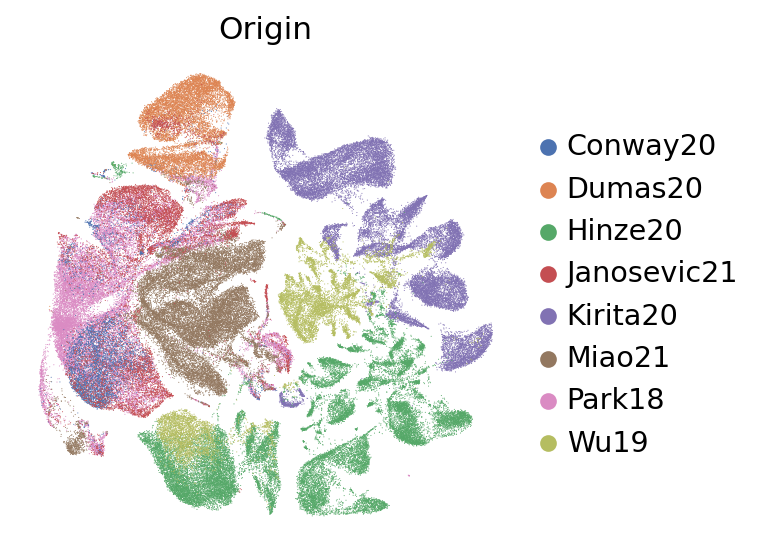

In [13]:
sc.pl.umap(atlas, color='Origin', palette=MY_PALETTES['deep'], save='Atlas_Unintegrated_SCVI_Full.svg')

In [14]:
cat_cols = atlas.obs.select_dtypes(include='category').columns.tolist()
metadata = pd.DataFrame(
    atlas.obs[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts()).rename(columns={0: 'counts'}).sort_values(by=['column', 'counts'])


In [16]:
metadata.to_csv('atlas_metadata_full.csv')

In [21]:
metadata_gb = metadata.groupby(['column', 'value']).agg({'counts': 'sum'})
metadata_pcts = metadata_gb.groupby(level=0).apply(lambda x:
                                                 100 * x / float(x.sum())).reset_index()
annotation_pcts = pd.DataFrame({
"column": ["Celltype", "Celltype"],
"value": ["Annotated", "Unannotated"],
"counts": [58.5, 41.5]
})

metadata_pcts = pd.concat([metadata_pcts, annotation_pcts]).reset_index()

In [23]:
metadata_pcts

,index,column,value,counts
0,0,Age,12-week,7.147050
1,1,Age,3-6months,21.630682
2,2,Age,4-8weeks,18.265783
3,3,Age,8-10 weeks,6.467422
4,4,Age,8-10weeks,18.281342
...,...,...,...,...
155,155,Tissue_res,Whole_Kidney,88.127382
156,156,batch,0,93.532578
157,157,batch,1,6.467422
158,0,Celltype,Annotated,58.500000


/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


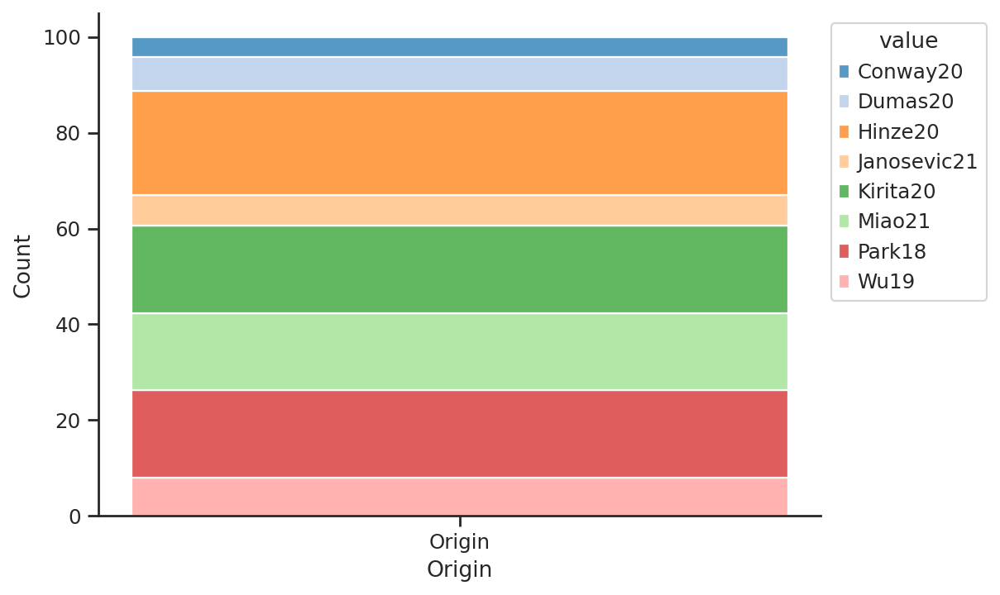

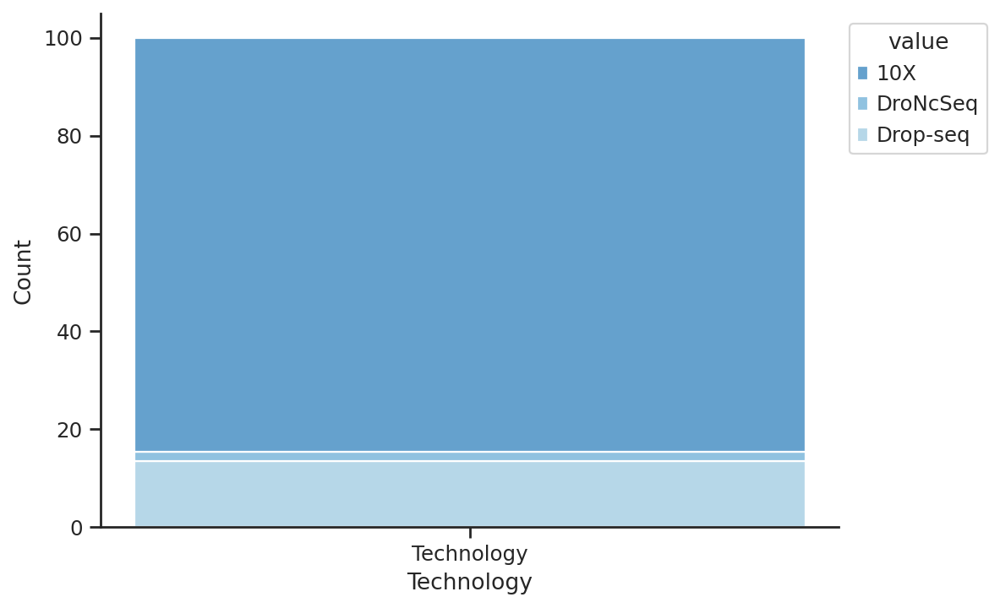

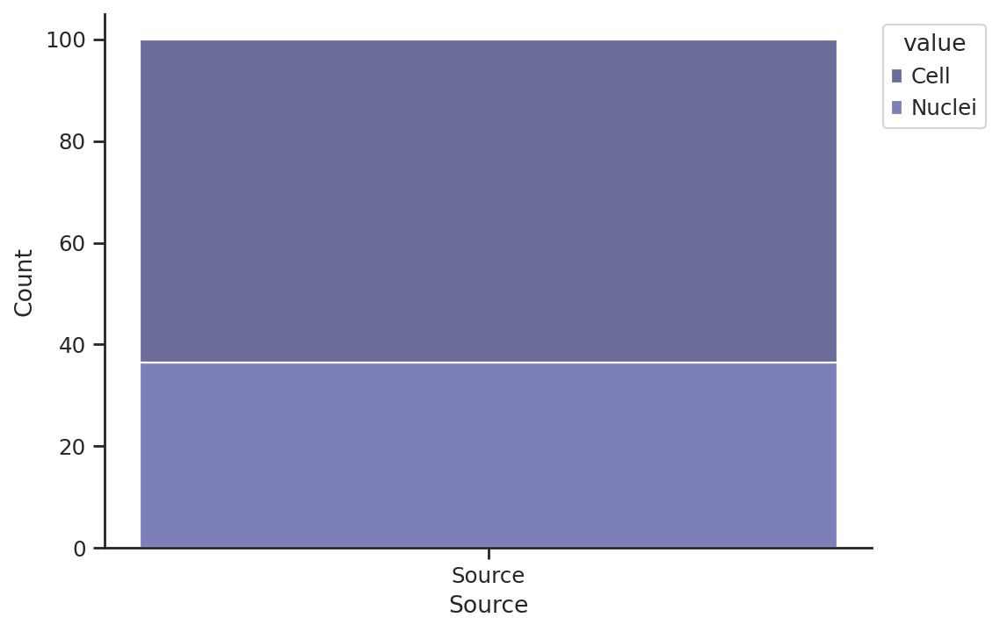

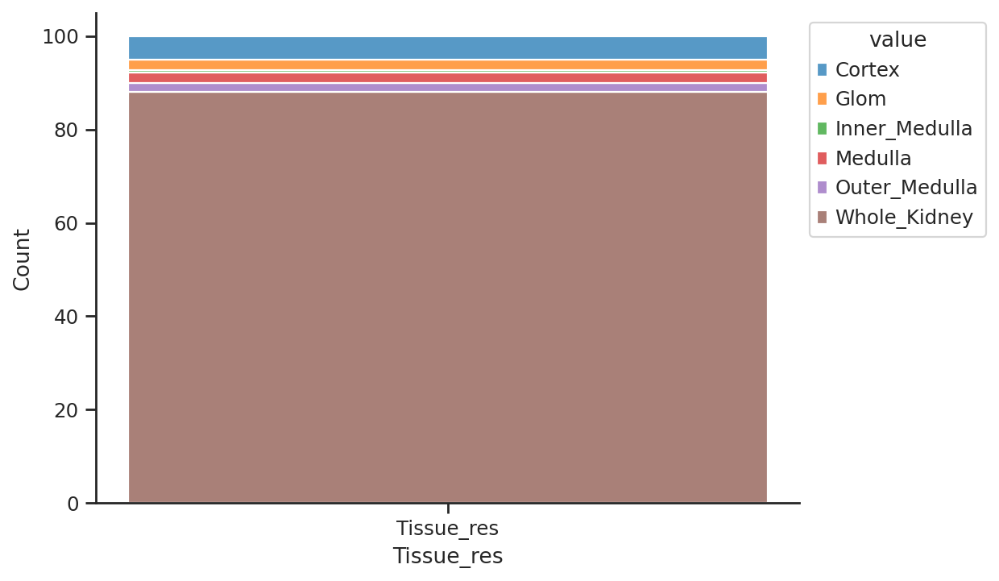

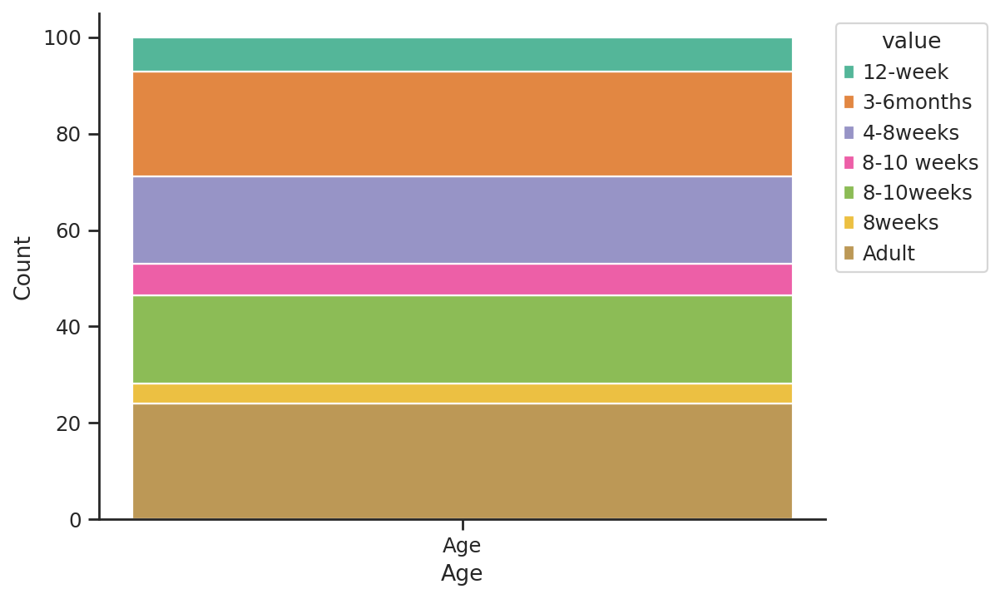

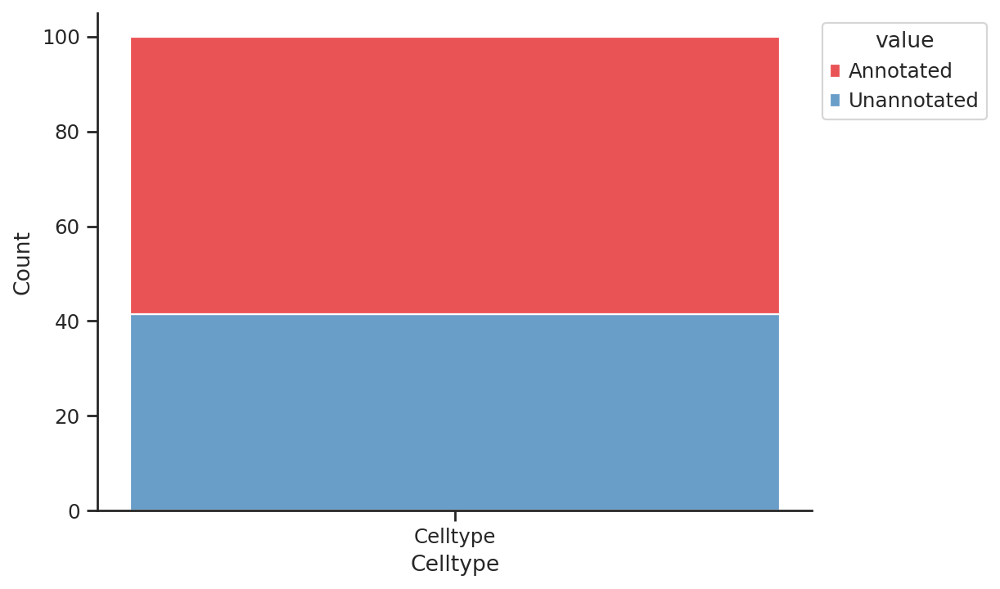

In [24]:
sns.set(rc={'figure.figsize':(7,5)})
sns.set_style("ticks")

cols = ['Origin', 'Technology', 'Source', 'Tissue_res', 'Age', 'Celltype']
palette = ['tab20', 'tab20c', 'tab20b', 'tab10', 'Dark2', 'Set1' ]
for i, n in zip(cols, palette):
    to_plot = metadata_pcts.loc[metadata_pcts['column'] == i,['value','counts']].set_index('value')
    to_plot[i] = [i] * len(to_plot)
    ax = sns.histplot(to_plot, x=i, hue='value', weights='counts', palette=sns.color_palette(''.join(s for s in plt.colormaps() if n == s), len(to_plot)), multiple='stack')
    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))
    sns.despine()
    plt.savefig(i + '_SCVI_full_' + '.svg',  bbox_inches='tight')
    plt.show()

In [25]:
metadata = metadata.reset_index()
delete_row = metadata[metadata["value"]=='Unknown'].index
metadata = metadata.drop(delete_row)
metadata_gb = metadata.groupby(['column', 'value']).agg({'counts': 'sum'})
metadata_pcts_over50 = metadata_gb.groupby(level=0).apply(lambda x:
                                                 100 * x / float(x.sum())).reset_index()

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


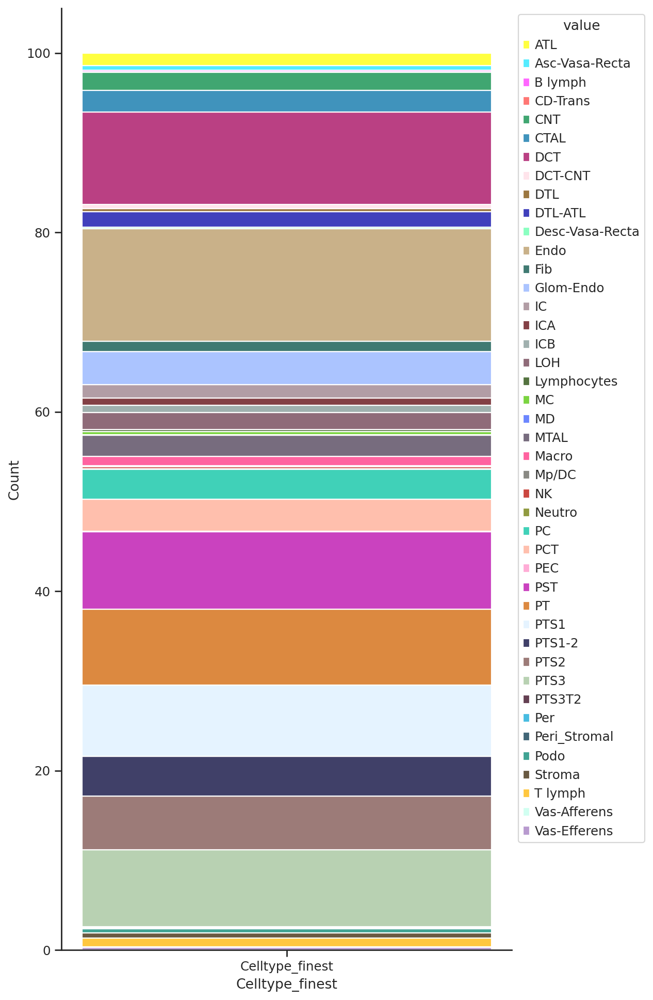

In [26]:
sns.set(rc={'figure.figsize':(7,15)})
sns.set_style("ticks")

cols = ['Celltype_finest']
palette = ['Set1' ]
for i, n in zip(cols, palette):
    to_plot = metadata_pcts_over50.loc[metadata_pcts_over50['column'] == i,['value','counts']].set_index('value')
    to_plot[i] = [i] * len(to_plot)
    ax = sns.histplot(to_plot, x=i, hue='value', weights='counts', palette=sc.pl.palettes.default_102[:len(to_plot)], multiple='stack')
    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))
    sns.despine()
    #plt.legend([], [], frameon=False)
    plt.savefig(i + '_SCVI_full_' + '.svg', bbox_inches='tight')
    plt.show()

In [27]:
metadata_pcts.to_csv('metadata_pcts_SCVI_Full.csv')

/exports/humgen/cnovellarausell/conda_envs/atlas_work/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [28]:
celltypes_upset = {}
for i in ['Park18', 'Kirita20', 'Wu19', 'Miao21', 'Dumas20', 'Janosevic21']: #  datasets with available annotations
    celltypes_upset[i] = [z for z in set(atlas[atlas.obs['Origin'] == i].obs['Celltype_finest']) if z != 'Unknown']
    

In [42]:
celltypes_upset_2

id
Park18 Kirita20 Wu19  Miao21 Dumas20 Janosevic21                 
True   False    False False  False   False                     PT
                                     False                     NK
       True     True  True   False   True                      PC
                             True    True                    Endo
                False False  False   False                T lymph
                True  True   False   True                     DCT
                False False  False   False                    Fib
       False    False True   False   True                      IC
                                     True                     LOH
                      False  False   False                B lymph
       True     True  True   False   False                  Macro
       False    False True   False   True                  Neutro
       True     True  True   False   False                   Podo
       False    False False  False   False               CD-Trans
False  True     True  False  False   False                    ICB
                False False  False   False                DCT-CNT
                                     True                    PTS1
                                     False                    PEC
                                     False                   CTAL
                                     False                DTL-ATL
                                     True                    PTS2
                True  False  False   True                    PTS3
                                     False                    ICA
                False False  False   False                   MTAL
                True  False  False   True                     CNT
                False False  False   False                     MD
                                     False                    Per
       False    True  False  False   False                    DTL
                                     False                 PTS1-2
                                     False                    ATL
                                     False                     MC
                False True   False   False                    PST
                                     False                    PCT
                                     False                 Stroma
                      False  True    False         Asc-Vasa-Recta
                                     False           Vas-Efferens
                                     False        Desc-Vasa-Recta
                                     False           Vas-Afferens
                                     False              Glom-Endo
                             False   True                  PTS3T2
                                     True            Peri_Stromal
                                     True                   Mp/DC
                                     True             Lymphocytes

In [ ]:
from upsetplot import from_contents, plot, UpSet
from matplotlib import cm
from matplotlib import pyplot as plt

celltypes_upset_2 = from_contents(celltypes_upset)


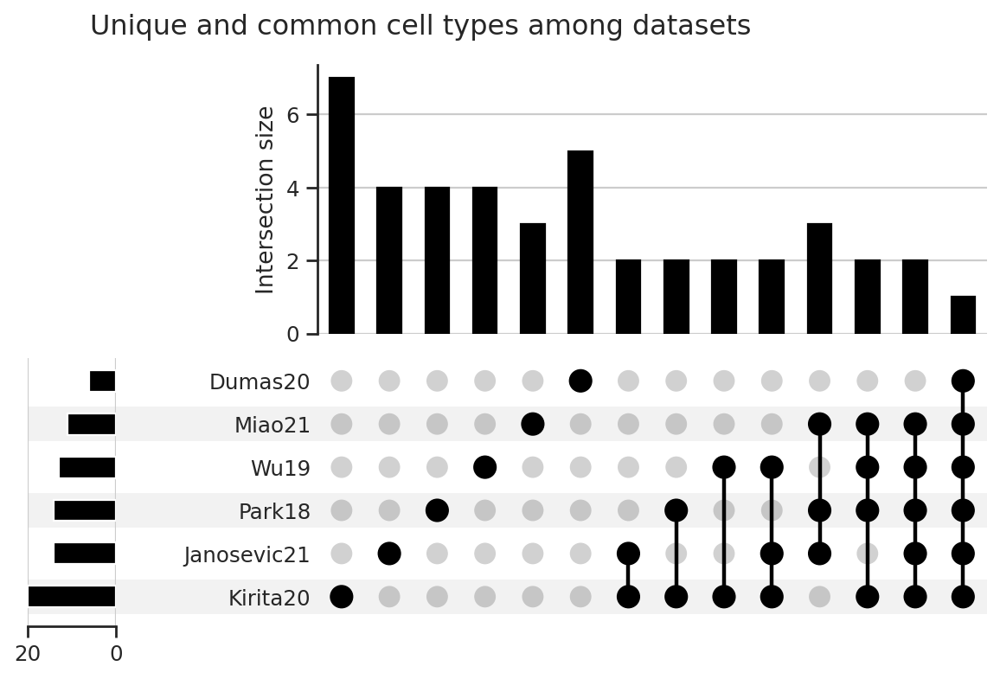

In [71]:
upset = UpSet(celltypes_upset_2,
             subset_size='count') 
# upset.add_stacked_bars(by = 'id', elements=20)
upset.plot()
plt.suptitle('Unique and common cell types among datasets')
plt.savefig('upsetplot_SCVI_Full.svg')
plt.show()

# Normalization, hvg selection and integration

We re-load the atlas in this step

In [88]:
atlas = sc.read_h5ad('/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_raw_v2.h5ad')

In [89]:
atlas

AnnData object with n_obs × n_vars = 141401 × 16711
    obs: 'Celltype_Kirita', 'Origin', 'Source', 'Technology', 'Tissue_res', 'Age', 'Genetic_background', 'Gender', 'n_genes', 'Celltype_Park', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'Celltype_Susztak', 'Celltype_Wu', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'Celltype_finest', 'Celltype_Dumas', 'Celltype_Janosevic'
    layers: 'counts'

In [90]:
sc.pp.filter_cells(atlas,min_counts=1)

In [91]:
sc.pp.normalize_total(atlas)
sc.pp.log1p(atlas)

In [92]:
atlas.raw = atlas

In [7]:
ref = atlas[atlas.obs.Celltype_finest != 'Unknown'].copy()

In [8]:
ref

AnnData object with n_obs × n_vars = 82710 × 16711
    obs: 'Celltype_Kirita', 'Origin', 'Source', 'Technology', 'Tissue_res', 'Age', 'Genetic_background', 'Gender', 'n_genes', 'Celltype_Park', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'Celltype_Susztak', 'Celltype_Wu', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'Celltype_finest', 'Celltype_Dumas', 'Celltype_Janosevic'
    var: 'mt', 'ribo-0', 'hb-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'gene_name-1', 'gene_id-1'
    layers: 'counts'

In [9]:
ref.write_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_reference_SCVI.h5ad")

In [10]:
query = atlas[atlas.obs.Celltype_finest == 'Unknown'].copy()

In [11]:
query

AnnData object with n_obs × n_vars = 58691 × 16711
    obs: 'Celltype_Kirita', 'Origin', 'Source', 'Technology', 'Tissue_res', 'Age', 'Genetic_background', 'Gender', 'n_genes', 'Celltype_Park', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'Celltype_Susztak', 'Celltype_Wu', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'Celltype_finest', 'Celltype_Dumas', 'Celltype_Janosevic'
    var: 'mt', 'ribo-0', 'hb-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'gene_name-1', 'gene_id-1'
    layers: 'counts'

In [12]:
query.write_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_query_SCVI.h5ad")

Seurat CCA integration takes a long time. It is recommended to use a job scheduler on HPC infrastructure. The following cells are shown as proof of workflow. 

## SCVI + SCANVI

SCVI integration was performed on HPC infrastracture with GPU acceleration, the following cells are shown as proof of concept

In [6]:
adata = sc.read("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_raw_v2.h5ad")

In [7]:
adata.raw = adata  # keep full dimension safe
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=3000,
    batch_key="Origin",
    subset=True
)


In [9]:
scvi.model.SCVI.setup_anndata(adata, batch_key="Origin", continuous_covariate_keys=['pct_counts_mt'], 
                      categorical_covariate_keys=['Source'])

In [11]:
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=26, gene_likelihood="nb", dropout_rate=0.09672091885923559)

In [12]:
vae.train(max_epochs = 111, plan_kwargs={"lr":0.0013153399994028092})

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/111:   0%|          | 0/111 [00:00<?, ?it/s]

/exports/humgen/cnovellarausell/conda_envs/scvi-tools/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:100: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is /home/cnovellarausell/.cache/torch/kernels. This warning will appear only once per process. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755897462/work/aten/src/ATen/native/cuda/jit_utils.cpp:860.)
  + lgamma(x + theta)


Epoch 111/111: 100%|██████████| 111/111 [14:55<00:00,  8.07s/it, loss=499, v_num=1]


In [13]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata)
sc.tl.umap(adata)

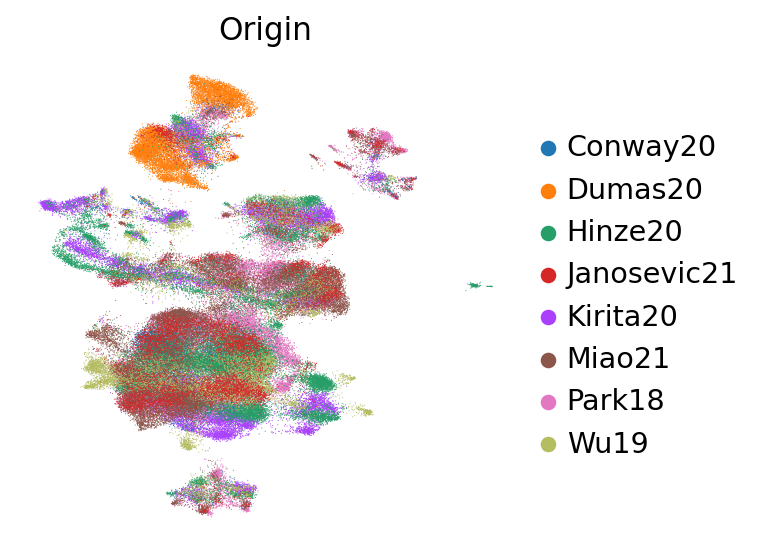

In [14]:
sc.pl.umap(
    adata,
    color="Origin",
    frameon=False
)

/exports/humgen/cnovellarausell/conda_envs/scvi-tools/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


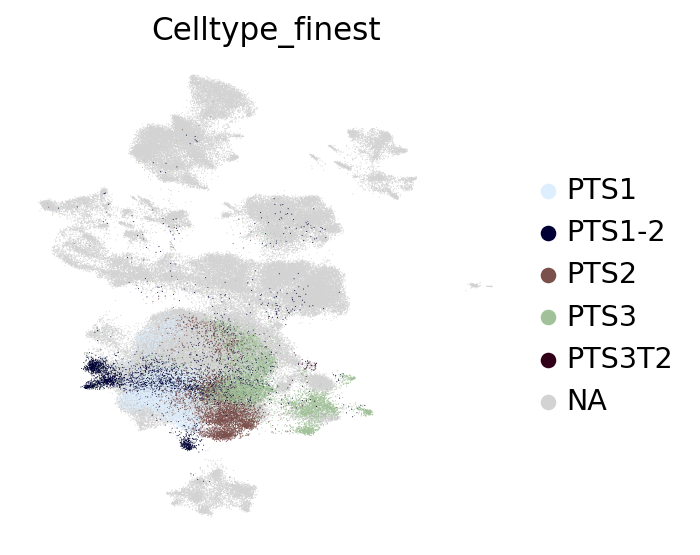

In [15]:
sc.pl.umap(
    adata,
    color="Celltype_finest",
    groups=["PTS2", "PTS1", "PTS1-2", "PTS3", "PTS3T2"],
    frameon=False)

In [41]:
Rename_CT = {
    'PTS1': 'PT',
    'PTS2': 'PT',
    'PTS3': 'PT', 
    'PTS1-2': 'PT',
    'PTS3T2': 'PT',
    'PST': 'PT',
    'PCT': 'PT',
    'Vas-Afferens': 'Endo',
    'Vas-Efferens': 'Endo',
    'Asc-Vasa-Recta': 'Endo',
    'Desc-Vasa-Recta': 'Endo',
    'Glom-Endo': 'Endo'}
adata.obs["Celltype_finest_lowres"] = adata.obs["Celltype_finest"].replace(Rename_CT)

In [42]:
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=adata,
    labels_key="Celltype_finest_lowres",
    unlabeled_category="Unknown",
)

/exports/humgen/cnovellarausell/conda_envs/scvi-tools/lib/python3.10/site-packages/scvi/model/_scanvi.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  labels == self.unlabeled_category_
/exports/humgen/cnovellarausell/conda_envs/scvi-tools/lib/python3.10/site-packages/scvi/model/_scanvi.py:255: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  self._labeled_indices = np.argwhere(labels != self.unlabeled_category_).ravel()


In [43]:
lvae.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                             


INFO:scvi.model._scanvi:Training for 20 epochs.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [05:57<00:00, 17.85s/it, loss=608, v_num=1]


In [32]:
adata

AnnData object with n_obs × n_vars = 141401 × 3000
    obs: 'Celltype_Kirita', 'Origin', 'Source', 'Technology', 'Tissue_res', 'Age', 'Genetic_background', 'Gender', 'n_genes', 'Celltype_Park', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'Celltype_Susztak', 'Celltype_Wu', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'Celltype_finest', 'Celltype_Dumas', 'Celltype_Janosevic', '_scvi_batch', '_scvi_labels', 'leiden', 'Celltype_finest_lowres'
    var: 'mt', 'ribo-0', 'hb-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'gene_name-1', 'gene_id-1', 'highly_variable', 'highly_variable_r

In [44]:
adata.obsm["X_scANVI"] = lvae.get_latent_representation(adata)
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.leiden(adata)
sc.tl.umap(adata)

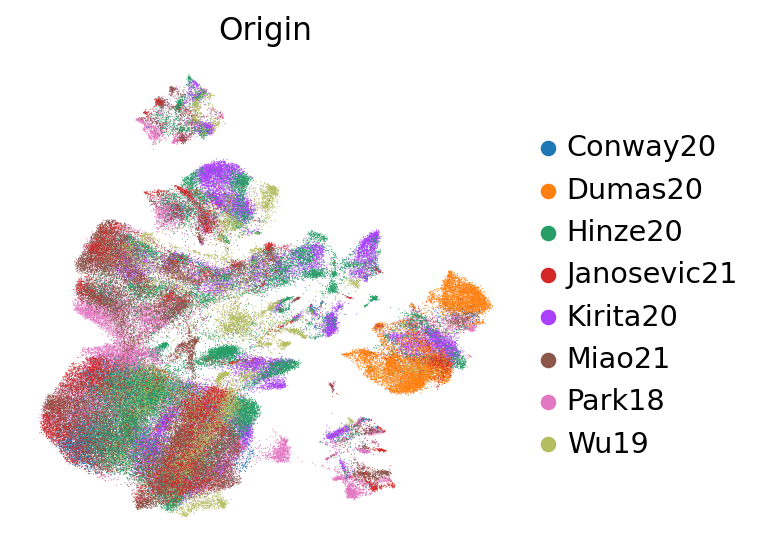

In [45]:
sc.pl.umap(
    adata,
    color="Origin",
    frameon=False
)

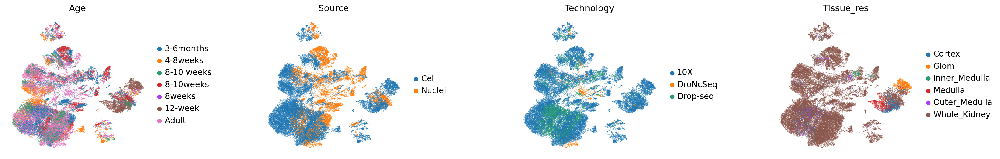

In [56]:
sc.pl.umap(adata, color=['Age', 'Source', 'Technology', 'Tissue_res'], wspace=0.6, frameon=False)

In [54]:
adata.write_h5ad("/exports/humgen/cnovellarausell/KidneyAtlas/h5ad/atlas_full_SCVI_SCANVI.h5ad")

In [55]:
lvae.save("SCANVI_model_full")
vae.save("Best_SCVI_model_full")